In [ ]:
!pip install ultralytics

In [17]:
# Download ICDAR 2003 dataset
# https://drive.google.com/file/d/1kUy2tuH-kKBlFCNA0a9sqD2TG4uyvBnV/view

!gdown 1kUy2tuH-kKBlFCNA0a9sqD2TG4uyvBnV
!unzip -q icdar2003.zip -d datasets

Downloading...
From (original): https://drive.google.com/uc?id=1kUy2tuH-kKBlFCNA0a9sqD2TG4uyvBnV
From (redirected): https://drive.google.com/uc?id=1kUy2tuH-kKBlFCNA0a9sqD2TG4uyvBnV&confirm=t&uuid=7e3487ce-9487-4f3a-a458-f3ca0fb48934
To: /kaggle/working/icdar2003.zip
100%|███████████████████████████████████████| 45.7M/45.7M [00:00<00:00, 163MB/s]


In [3]:
import ultralytics

ultralytics.checks()

Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6037.7/8062.4 GB disk)


In [5]:
import os

import matplotlib.pyplot as plt
import timm
from PIL import Image

from ultralytics import YOLO

import torch
import torch.nn as nn
from torchvision import transforms

## Load Model

### Load YOLO

In [6]:
text_det_model_path = "/kaggle/input/best/other/default/1/best.pt"
yolo = YOLO(text_det_model_path)

### Load CRNN

In [7]:
class CRNN(nn.Module):
    def __init__(self, vocab_size, hidden_size, n_layers, dropout=0.2, unfreeze_layers=3):
        super(CRNN, self).__init__()
        
        # Backbone: ResNet152 with first layer adjusted for grayscale (1 channel)
        backbone = timm.create_model("resnet152", in_chans=1, pretrained=True)
        modules = list(backbone.children())[:-2] # Remove fully connected and pooling layers
        modules.append(nn.AdaptiveAvgPool2d((1, None))) # Adaptive pooling for variable width

        self.backbone = nn.Sequential(*modules)

        # Unfreeze last few layers of backbone for fine-tuning
        for param in self.backbone[-unfreeze_layers:].parameters():
            param.requires_grad = True

        # Map feature dimensions from ResNet output (2048) to GRU input size (512)
        self.mapSeq = nn.Sequential(
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        # GRU: Bi-directional RNN for sequential modeling
        self.gru = nn.GRU(
            512,
            hidden_size,
            n_layers,
            bidirectional=True,
            batch_first=True, # Input shape: (batch, sequence, features)
            dropout=dropout if n_layers > 1 else 0,
        )

        # Layer normalization to stabilize GRU outputs
        self.layer_norm = nn.LayerNorm(hidden_size * 2)

        # Output layer: Map GRU output to vocabulary size with log-softmax
        self.out = nn.Sequential(
            nn.Linear(hidden_size * 2, vocab_size),
            nn.LogSoftmax(dim=2)
        )

    @torch.autocast(device_type="cuda")
    def forward(self, x):
        # ResNet Backbone
        x = self.backbone(x) # Extract features from the image
        x = x.permute(0, 3, 1, 2) # Rearrange dimensions to (batch, sequence, features, height)
        x = x.view(x.size(0), x.size(1), -1) # Flatten feature map for GRU input
        
        # Map features to GRU input size
        x = self.mapSeq(x)
        
        # GRU for sequential modeling
        x, _ = self.gru(x)
        
        # Normalize GRU outputs
        x = self.layer_norm(x)
        
        # Map to vocabulary size and apply log-softmax
        x = self.out(x)
        
        # Rearrange dimensions for CTC Loss: (sequence_length, batch_size, vocab_size)
        x = x.permute(1, 0, 2)
        return x

In [8]:
chars = "0123456789abcdefghijklmnopqrstuvwxyz-"
vocab_size = len(chars)

char_to_idx = {char: idx + 1 for idx, char in enumerate(sorted(chars))}
idx_to_char = {idx: char for char, idx in char_to_idx.items()}

In [9]:
hidden_size = 256
n_layers = 3
dropout_prob = 0.2
unfreeze_layers = 3
device = "cuda" if torch.cuda.is_available() else "cpu"
model_path = "/kaggle/input/best/other/default/1/ocr_crnn.pt"

crnn_model = CRNN(
    vocab_size=vocab_size,
    hidden_size=hidden_size,
    n_layers=n_layers,
    dropout=dropout_prob,
    unfreeze_layers=unfreeze_layers,
).to(device)
crnn_model.load_state_dict(torch.load(model_path))

model.safetensors:   0%|          | 0.00/241M [00:00<?, ?B/s]

<All keys matched successfully>

## Inference

In [32]:
def decode(encoded_sequences, idx_to_char, blank_char="-"):
    """Decodes encoded sequences back into strings."""
    
    decoded_sequences = [] 

    for seq in encoded_sequences:
        decoded_label = [] # Store decoded characters for a single sequence
        prev_char = None # Track the previous character to handle repeated characters

        for token in seq:
            if token != 0:  # Ignore padding (token = 0)
                char = idx_to_char[token.item()] # Map index to character
                # Append the character if it's not a blank or repeated
                if char != blank_char:
                    if char != prev_char or prev_char == blank_char:
                        decoded_label.append(char)
                prev_char = char # Update the previous character tracker
        
        # Join decoded characters into a single string
        decoded_sequences.append("".join(decoded_label))

    print(f"From {encoded_sequences} to {decoded_sequences}")
    return decoded_sequences


def text_detection(img_path, text_det_model):
    """Perform text detection on an image using a given text detection model."""

    # Perform inference using the text detection model
    text_det_results = text_det_model(img_path, verbose=False)[0]

    bboxes = text_det_results.boxes.xyxy.tolist() # List of bounding boxes (x1, y1, x2, y2)
    classes = text_det_results.boxes.cls.tolist()  # List of detected class IDs
    names = text_det_results.names # List of class names
    confs = text_det_results.boxes.conf.tolist() #list of confidence scores

    return bboxes, classes, names, confs


def text_recognition(img, data_transforms, text_reg_model, idx_to_char, device):
    """Perform text recognition on an input image using a given text recognition model."""

    # Apply the data transformations to the image
    transformed_image = data_transforms(img)

    # Add a batch dimension
    transformed_image = transformed_image.unsqueeze(0).to(device)

    text_reg_model.eval()
    with torch.no_grad():
        logits = text_reg_model(transformed_image).detach().cpu()

    # Decode the model's output logits into text using the index-to-character mapping
    text = decode(logits.permute(1, 0, 2).argmax(2), idx_to_char)
    
    return text


def visualize_detections(img, detections):
    # Display image
    plt.figure(figsize=(12, 8))
    plt.imshow(img)
    plt.axis("off")

    # Draw bounding boxes and add labels
    for bbox, detected_class, confidence, transcribed_text in detections:
        x1, y1, x2, y2 = bbox
    
        plt.gca().add_patch(
            plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="red", linewidth=2)
        )

        plt.text(
            x1,
            y1 - 10,
            f"{detected_class} ({confidence:.2f}): {transcribed_text}",
            fontsize=9,
            bbox=dict(facecolor="red", alpha=0.5)
        )
    plt.show()

In [33]:
data_transforms = {
    "train": transforms.Compose(
        [
            transforms.Resize((100, 420)),
            transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
            transforms.Grayscale(num_output_channels=1),
            transforms.GaussianBlur(3),
            transforms.RandomAffine(degrees=1, shear=1),
            transforms.RandomPerspective(distortion_scale=0.3, p=0.5, interpolation=3),
            transforms.RandomRotation(degrees=2),
            transforms.ToTensor(),
            transforms.Normalize((0.5,), (0.5,))
        ]
    ),
    "val": transforms.Compose(
        [
            transforms.Resize((100, 420)),
            transforms.Grayscale(num_output_channels=1),
            transforms.ToTensor(),
            transforms.Normalize((0.5,), (0.5,))
        ]
    )
}

In [34]:
def predict(img_path, data_transforms, text_det_model, text_reg_model, idx_to_char, device):
    # Detect text bounding boxes, classes, names, and confidences
    bboxes, classes, names, confs = text_detection(img_path, text_det_model)

    # Load image
    img = Image.open(img_path)

    predictions = []

    # Loop through each detected bounding box
    for bbox, cls, conf in zip(bboxes, classes, confs):
        x1, y1, x2, y2 = bbox # Get coordinates of the bounding box
        confidence = conf # Get confidence score of the detection
        detected_class = cls # Get detected class ID
        name = names[int(cls)] # Map class ID to class name

        # Crop the image to the bounding box area
        cropped_image = img.crop((x1, y1, x2, y2))

        # Recognize text in the cropped image
        transcribed_text = text_recognition(
            cropped_image, data_transforms, text_reg_model, idx_to_char, device
        )

        # Append prediction to the list
        predictions.append((bbox, name, confidence, transcribed_text))

    # Visualize the predictions on the image
    visualize_detections(img, predictions)
    return predictions

From tensor([[ 1, 17,  1, 29,  1, 16,  1, 16, 15,  1, 26,  1, 24,  1]]) to ['freedom']


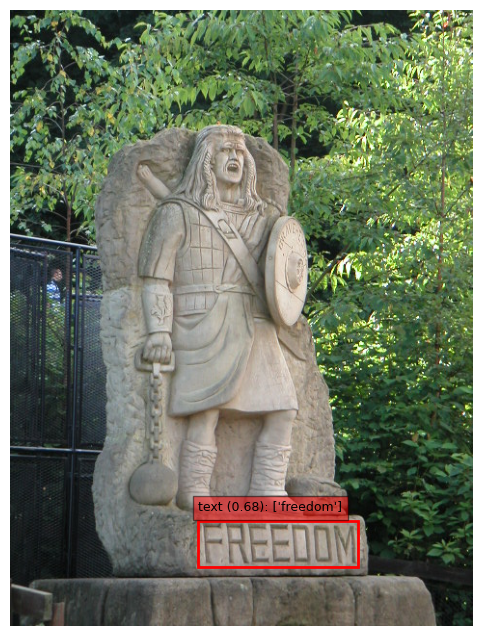

From tensor([[ 1, 12,  1, 25,  1, 14, 20, 20, 16,  1, 25,  1, 31, 31]]) to ['ancient']
From tensor([[ 1,  1,  1, 30, 30,  1,  1,  1,  1,  1,  1, 14,  1,  1]]) to ['sc']
From tensor([[ 1,  1,  1, 22,  1,  1,  1,  1,  1,  1,  1, 33,  1,  1]]) to ['kv']
From tensor([[ 1, 24, 26, 26, 25, 25, 32, 24, 24, 16,  1, 25, 31, 31]]) to ['monument']
From tensor([[ 1, 14,  1, 12,  1, 24, 27, 27, 13, 16, 16, 23,  1, 23]]) to ['campbell']
From tensor([[1, 1, 1, 6, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]]) to ['4']
From tensor([[ 1, 14,  1, 12, 12, 30, 30,  1, 31,  1, 23,  1, 16,  1]]) to ['castle']


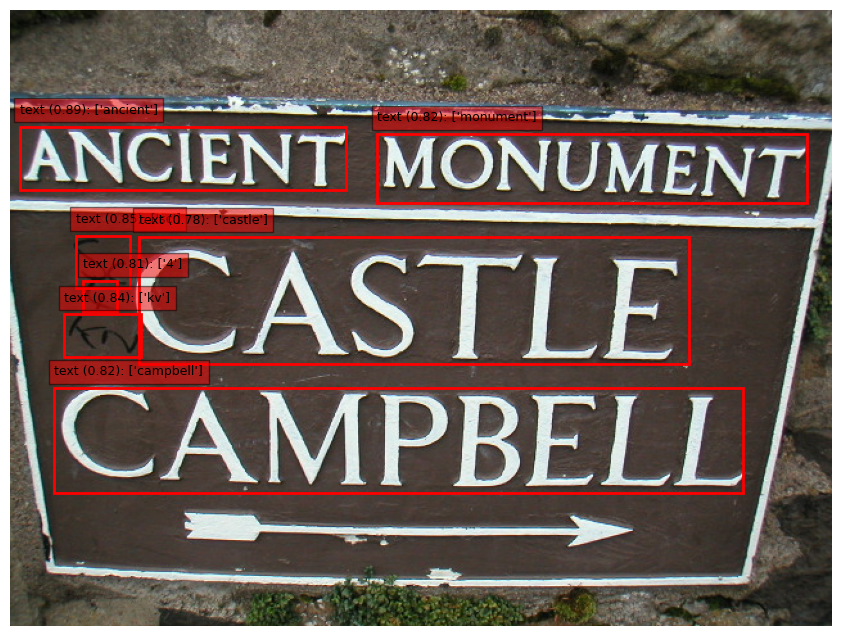

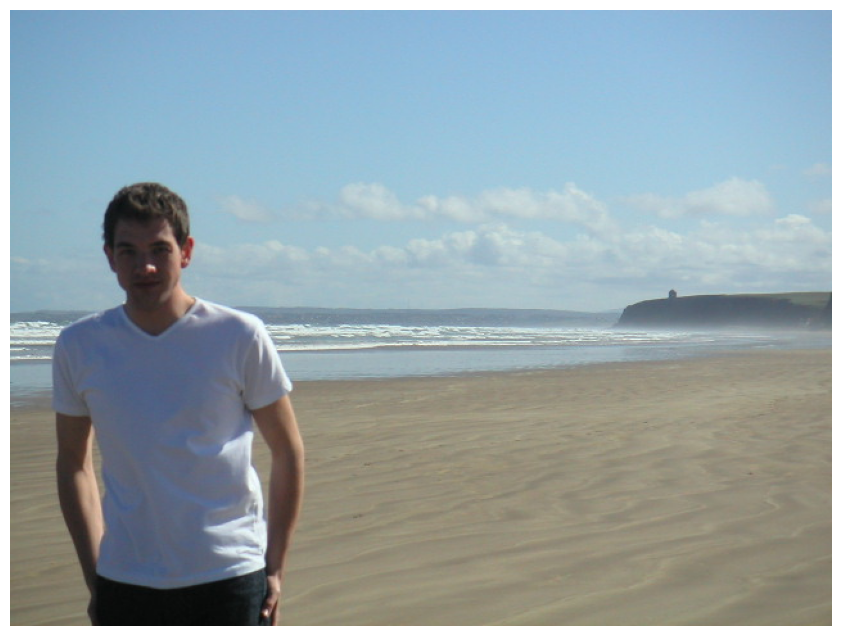

From tensor([[ 1,  1,  1,  1, 26,  1,  1,  1,  1,  1, 17, 17,  1,  1]]) to ['of']
From tensor([[ 1, 19, 19,  1, 16,  1, 29,  1, 26,  1, 16, 16, 30, 30]]) to ['heroes']
From tensor([[ 1,  1, 19,  1,  1, 12, 12,  1,  1, 23,  1, 23, 23,  1]]) to ['hall']


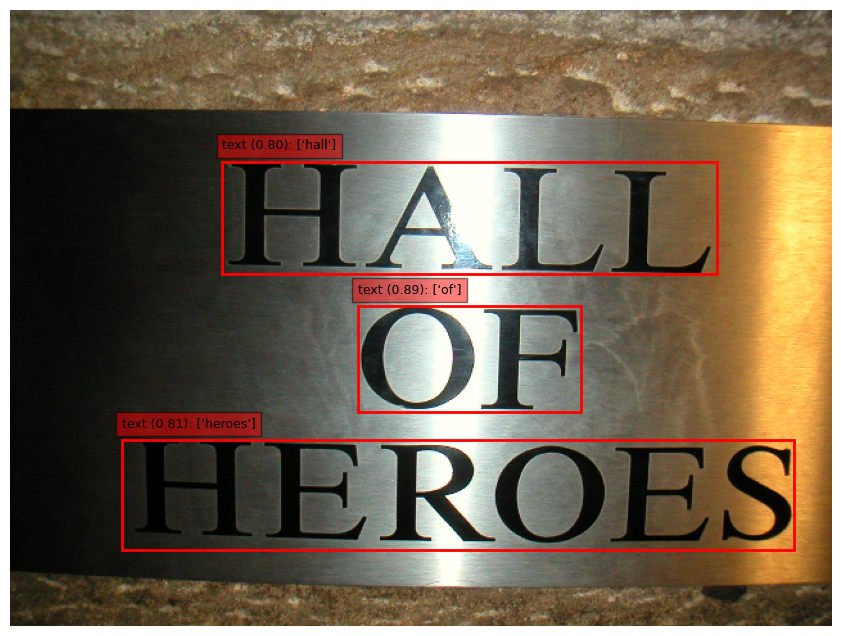

From tensor([[ 1,  1, 18,  1,  1, 23,  1,  1, 16,  1,  1, 25,  1,  1]]) to ['glen']
From tensor([[ 1,  1, 12,  1,  1,  1, 25,  1,  1,  1, 15, 15,  1,  1]]) to ['and']
From tensor([[ 1, 15,  1, 26,  1,  1, 23,  1, 23,  1, 12,  1, 29,  1]]) to ['dollar']
From tensor([[ 1, 14, 14, 12, 12, 30, 30,  1, 31,  1, 23,  1, 16,  1]]) to ['castle']
From tensor([[ 1, 14,  1, 12,  1, 24, 27, 27, 13, 16, 16, 23,  1, 23]]) to ['campbell']


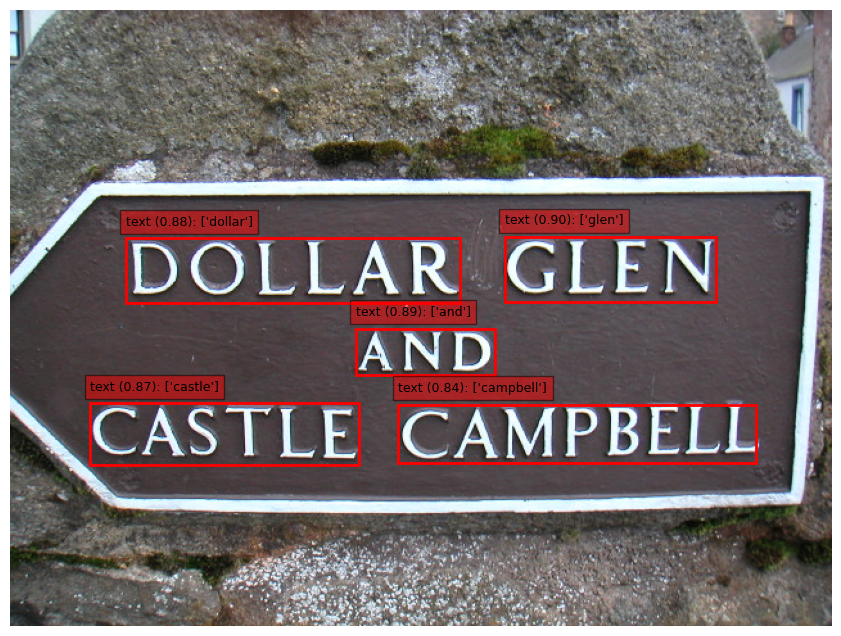

From tensor([[ 1, 14,  1, 12,  1, 24, 27, 27, 13, 16, 23, 23,  1, 23]]) to ['campbell']
From tensor([[ 1, 14, 14,  1, 12,  1, 30,  1, 31,  1, 23,  1, 16,  1]]) to ['castle']


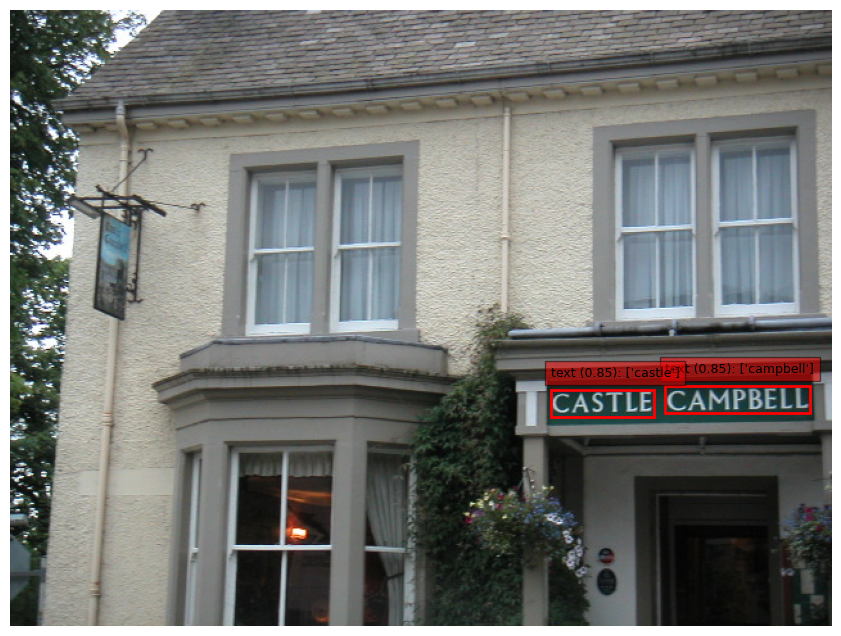

From tensor([[ 1, 34, 34,  1, 12, 23,  1,  1, 23, 12,  1, 14, 16, 16]]) to ['wallace']
From tensor([[ 1, 24, 26, 26, 25, 25, 32, 24, 24, 16,  1, 25, 31, 31]]) to ['monument']


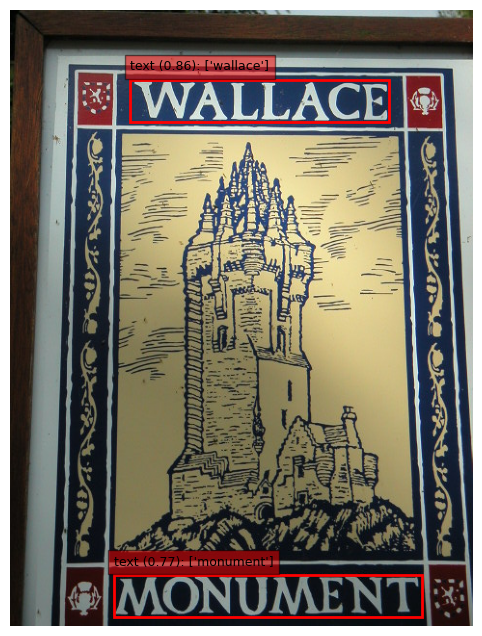

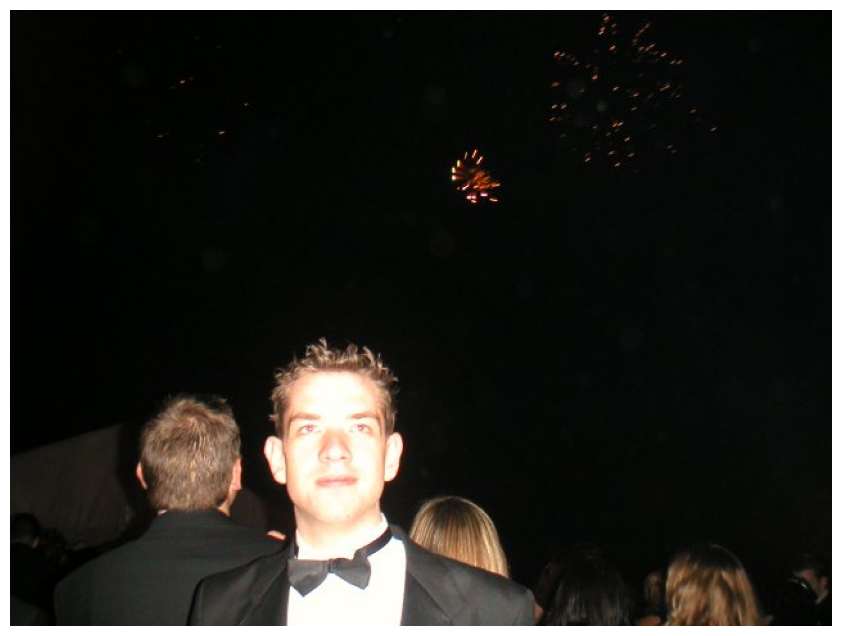

From tensor([[ 1,  1, 18,  1,  1, 26,  1,  1, 23,  1,  1, 17, 17,  1]]) to ['golf']
From tensor([[ 1, 15,  1, 26,  1, 23,  1, 23, 23, 12, 12,  1, 29,  1]]) to ['dollar']
From tensor([[ 1,  1, 14,  1,  1, 23,  1,  1, 32,  1,  1, 13,  1,  1]]) to ['club']
From tensor([[ 1,  1, 12, 12,  1, 15, 15,  1,  1, 31, 31,  1,  1,  1]]) to ['adt']


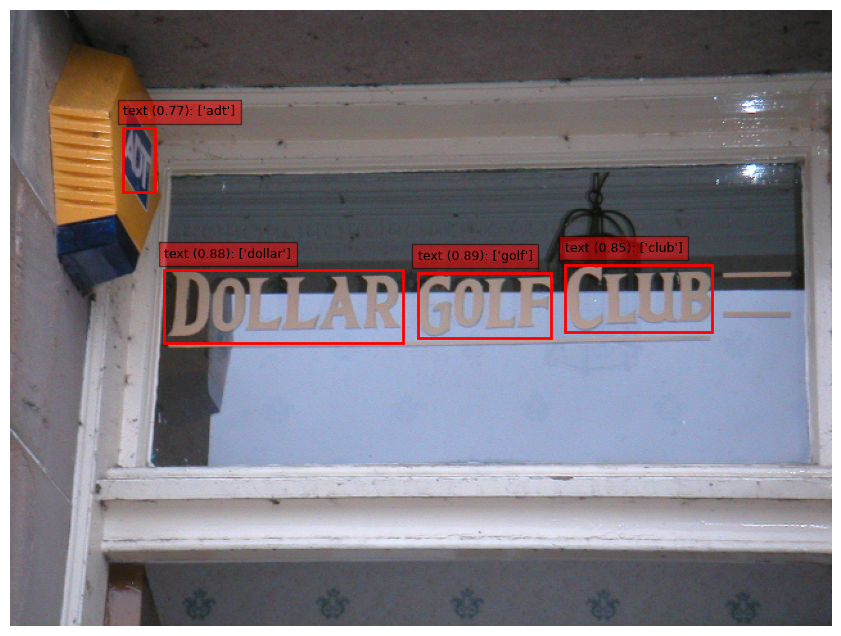

From tensor([[ 1,  1, 16,  1,  1,  1, 35,  1,  1, 20,  1, 31, 31,  1]]) to ['exit']
From tensor([[ 1,  1, 18,  1, 12, 12,  1, 31, 31, 16, 16,  1, 30, 30]]) to ['gates']
From tensor([[1, 1, 5, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1]]) to ['30']
From tensor([[16, 16,  1, 24, 16, 29, 29, 18, 16, 16, 25, 14, 36, 36]]) to ['emergency']
From tensor([[ 1,  1, 10, 10,  1,  1,  1,  1,  1, 10,  1,  1,  1,  1]]) to ['88']


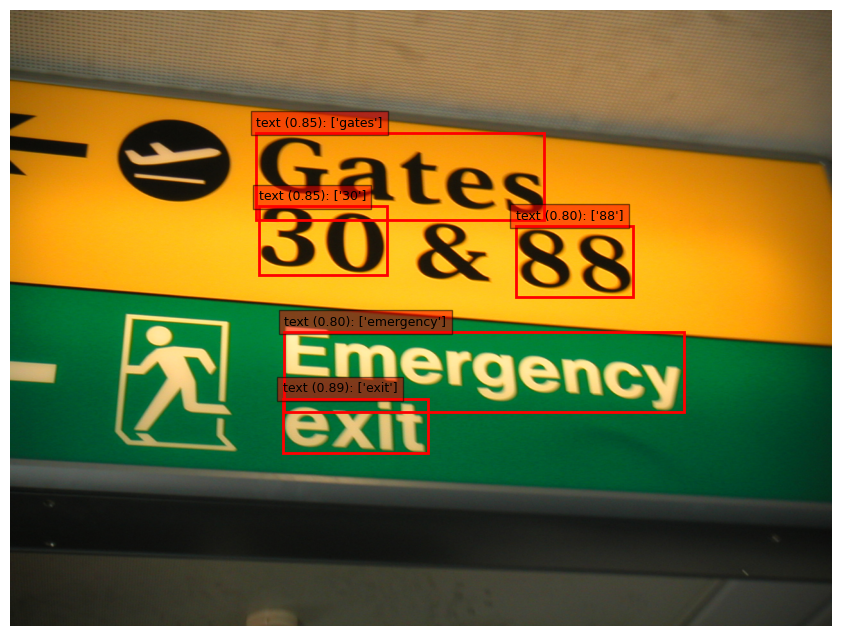

From tensor([[ 1, 25,  1, 12, 31, 31, 20, 26,  1, 25,  1, 12, 23, 23]]) to ['national']
From tensor([[ 1, 18,  1, 12,  1, 23,  1, 23, 16,  1, 29,  1, 36, 36]]) to ['gallery']
From tensor([[ 1, 24,  1, 26, 26,  1, 15,  1, 16,  1, 29,  1, 25,  1]]) to ['modern']
From tensor([[30, 30, 14, 14, 26,  1, 31,  1, 31, 20, 20, 30, 19,  1]]) to ['scottish']


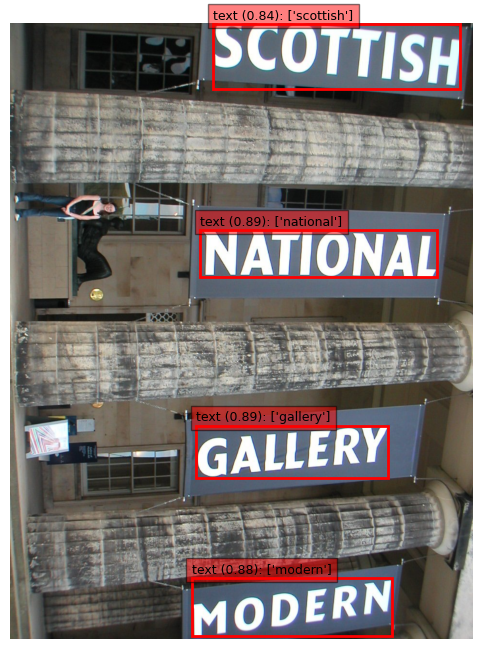

In [35]:
img_dir = "/kaggle/working/datasets/SceneTrialTrain/ryoungt_03.09.2002"
inf_transforms = data_transforms["val"]

for idx, img_filename in enumerate(os.listdir(img_dir)):
    img_path = os.path.join(img_dir, img_filename)
    predictions = predict(
        img_path,
        data_transforms=inf_transforms,
        text_det_model=yolo,
        text_reg_model=crnn_model,
        idx_to_char=idx_to_char,
        device=device,
    )

    if idx == 10:
        break